# Machine Learning 

---

In [2]:
#imports

# process
import numpy as np
import pandas as pd

# ML
import prince
import sklearn
from sklearn.feature_extraction import DictVectorizer

#recherche
import re
import requests

# visualisation
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

### Import des données

In [3]:
df = pd.read_csv("data_films.csv", sep=";")

In [4]:
df.describe()

,runtime,rating,metascore
count,23937.000000,23937.000000,23937.000000
mean,107.884656,6.497702,49.233613
std,19.905891,0.990003,25.479960
min,45.000000,1.200000,-1.000000
25%,95.000000,5.900000,36.000000
50%,104.000000,6.600000,53.000000
75%,117.000000,7.200000,67.000000
max,366.000000,9.300000,100.000000


In [5]:
df.describe(include='O')

,name,year,certificate,genre,text-muted,director,stars
count,23937,23937,22688,23937,23937,23937,23937
unique,8226,183,31,413,8406,3511,8364
top,Tarzan,2018,Tous publics,"['Animation', ' Adventure', ' Comedy ...","During World War II, American expatriate Harry...","['Clint Eastwood', None]","['William Shatner', 'Leonard Nimoy', 'DeForest..."
freq,15,785,11354,1203,12,107,22


### Séparer les données

In [6]:
df_ = df[["year","runtime", "rating","metascore", "certificate"]]
df_["year"] = df_["year"].apply(lambda x : int(re.search("\d+",x).group(0)))
df_["main_genre"] = df["genre"].apply(lambda x : x.split("'")[1])
df_["n_genre"] = df["genre"].apply(lambda x : max(len(x.split("'"))-2, 0))
df_["n_directors"] = df["director"].apply(lambda x :max(len(x.split("'"))-2, 0) )
df_["n_stars"] = df["stars"].apply(lambda x : max(len(x.split("'"))-2, 0) )

C:\Users\bapti\AppData\Local\Temp\ipykernel_17116\3464485042.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_["year"] = df_["year"].apply(lambda x : int(re.search("\d+",x).group(0)))
C:\Users\bapti\AppData\Local\Temp\ipykernel_17116\3464485042.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_["main_genre"] = df["genre"].apply(lambda x : x.split("'")[1])
C:\Users\bapti\AppData\Local\Temp\ipykernel_17116\3464485042.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

In [7]:
df.iloc[0]

name                         The Dark Knight : Le Chevalier noir
year                                                        2008
certificate                                         Tous publics
runtime                                                      152
genre                 ['Action', ' Crime', ' Drama            ']
rating                                                       9.0
metascore                                                     84
text-muted     When the menace known as the Joker wreaks havo...
director                             ['Christopher Nolan', None]
stars          ['Christian Bale', 'Heath Ledger', 'Aaron Eckh...
Name: 0, dtype: object

In [8]:
df_.describe()

,year,runtime,rating,metascore,n_genre,n_directors,n_stars
count,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000
mean,2001.080002,107.884656,6.497702,49.233613,4.597026,1.430171,6.962694
std,18.448256,19.905891,0.990003,25.479960,0.904647,1.699170,0.219542
min,1916.000000,45.000000,1.200000,-1.000000,1.000000,0.000000,3.000000
25%,1994.000000,95.000000,5.900000,36.000000,5.000000,1.000000,7.000000
50%,2006.000000,104.000000,6.600000,53.000000,5.000000,1.000000,7.000000
75%,2014.000000,117.000000,7.200000,67.000000,5.000000,1.000000,7.000000
max,2022.000000,366.000000,9.300000,100.000000,5.000000,55.000000,9.000000


array([[<AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'runtime'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'metascore'}>,
        <AxesSubplot:title={'center':'n_genre'}>,
        <AxesSubplot:title={'center':'n_directors'}>],
       [<AxesSubplot:title={'center':'n_stars'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

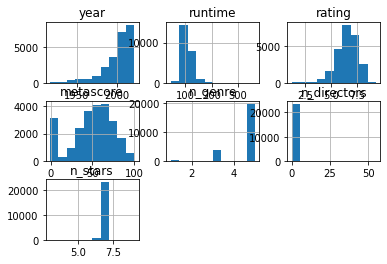

In [9]:
df_.hist()

### One Hot Encode the main genre

In [10]:
# df_.join(pd.get_dummies(df_["certificate"], prefix="certificate_"))
# df_.drop(["certificate"], axis = 1, inplace=True)
# df_.join(pd.get_dummies(df_["main_genre"], prefix="main_genre_"))
# df_.drop(["main_genre"], axis = 1, inplace=True)

### Some visualisation

In [11]:
fig = px.scatter_3d(df_, x="year", y="runtime",z="rating", size="n_genre")
fig.show()

In [12]:
corr = df_.corr()
px.imshow(corr)

### Normalize the dataset

In [13]:
cols = ["year","runtime","rating","metascore","n_genre","n_directors","n_stars"]
df_[cols] = (df_[cols]-df_[cols].min())/(df_[cols].max()-df_[cols].min())

C:\Users\bapti\AppData\Local\Temp\ipykernel_17116\813695033.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## FAMD

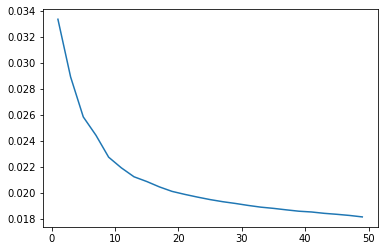

In [14]:
inertia = []
for i in range(1,50, 2):
    famd = prince.FAMD(n_components=i, n_iter=3,
                    copy=True, check_input=True,
                    engine='auto',random_state=42)
    famd = famd.fit(df_)
    inertia += [sum(famd.explained_inertia_)/i]

plt.plot(range(1,50, 2), inertia)

In [15]:
famd = prince.FAMD(n_components=4, n_iter=3,
                   copy=True, check_input=True,
                   engine='auto',random_state=42)

famd = famd.fit(df_)
coords = famd.row_coordinates(df_)

print(sum(famd.explained_inertia_))

0.11132722558743016


In [16]:
df_famd = df_.join(coords)
df_famd

,year,runtime,rating,metascore,certificate,main_genre,n_genre,n_directors,n_stars,0,1,2,3
0,0.867925,0.333333,0.962963,0.841584,Tous publics,Action,1.0,0.018182,0.666667,2.164346,0.645620,-1.013295,0.188176
1,0.820755,0.485981,0.962963,0.940594,Tous publics,Action,1.0,0.018182,0.666667,2.962522,0.674331,-1.719741,0.063458
2,0.896226,0.629283,0.938272,0.000000,NaN,Action,1.0,0.018182,0.666667,1.826772,1.011961,-2.513871,-0.478293
3,0.886792,0.320872,0.938272,0.742574,Tous publics,Action,1.0,0.018182,0.666667,1.891708,0.697750,-0.932976,0.147270
4,0.811321,0.417445,0.938272,0.871287,Tous publics,Action,1.0,0.018182,0.666667,2.523976,0.654615,-1.374125,0.089974
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23932,0.547170,0.208723,0.765432,0.801980,12,Action,1.0,0.018182,0.666667,0.542461,0.445528,-0.979612,1.099602
23933,0.537736,0.186916,0.765432,0.693069,Tous publics,Drama,1.0,0.018182,0.666667,1.311317,-0.371197,0.075840,-0.064604
23934,0.528302,0.277259,0.765432,0.524752,Tous publics,Adventure,1.0,0.018182,0.666667,1.577161,-0.122431,-0.018402,-0.734876
23935,0.500000,0.258567,0.765432,0.831683,12,Adventure,1.0,0.018182,0.666667,1.167854,-0.180974,-0.740684,0.376683


array([[<AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'runtime'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'metascore'}>,
        <AxesSubplot:title={'center':'n_genre'}>,
        <AxesSubplot:title={'center':'n_directors'}>],
       [<AxesSubplot:title={'center':'n_stars'}>,
        <AxesSubplot:title={'center':'0'}>,
        <AxesSubplot:title={'center':'1'}>],
       [<AxesSubplot:title={'center':'2'}>,
        <AxesSubplot:title={'center':'3'}>, <AxesSubplot:>]], dtype=object)

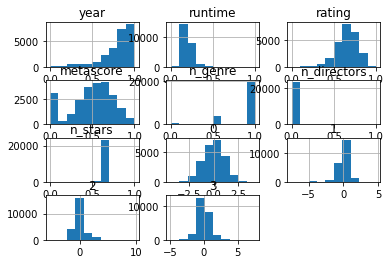

In [17]:
df_famd.hist()

In [18]:
fig = px.scatter(df_famd, x=0, y=1, color=2)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor="LightSteelBlue",
    xaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[0],3)}"},
        titlefont_size=16,
        tickfont_size=14
    ),
    yaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[1],3)}"},
        titlefont_size=16,
        tickfont_size=14
    )
)

fig.show()

In [19]:
fig = px.scatter(coords, x=3, y=1, color=0)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor="LightSteelBlue",
    xaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[3],3)}"},
        titlefont_size=16,
        tickfont_size=14
    ),
    yaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[4],3)}"},
        titlefont_size=16,
        tickfont_size=14
    )
)

fig.show()

IndexError: index 4 is out of bounds for axis 0 with size 4

In [ ]:
fig = px.scatter(coords, x=0, y=3, color=2)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor="LightSteelBlue",
    xaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[0],3)}"},
        titlefont_size=16,
        tickfont_size=14
    ),
    yaxis=dict(
        title={
            'text':f"inertie : {np.round(famd.explained_inertia_[3],3)}"},
        titlefont_size=16,
        tickfont_size=14
    )
)

fig.show()

In [ ]:
nx, ny, nz, ncol = 0, 1, 2, 3
fig = px.scatter_3d(coords, x=nx, y=ny, z=nz, color=ncol)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor="LightSteelBlue"
    # xaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(famd.explained_inertia_[nx],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # ),
    # yaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(famd.explained_inertia_[ny],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # ),
    # zaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(famd.explained_inertia_[nz],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # )
)

fig.show()

In [ ]:
nx, ny, nz, ncol = 1, 2, 3, 0
fig = px.scatter_3d(coords, x=nx, y=ny, z=nz, color=ncol)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor="LightSteelBlue"
    # xaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(pca.explained_inertia_[nx],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # ),
    # yaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(pca.explained_inertia_[ny],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # ),
    # zaxis=dict(
    #     title={
    #         'text':f"inertie : {np.round(pca.explained_inertia_[nz],3)}"},
    #     titlefont_size=16,
    #     tickfont_size=14
    # )
)

fig.show()

print()

In [ ]:
famd.total_inertia_

0.0015058122908590164

In [ ]:
coords.corr()

,0,1,2,3
0,1.000000,0.001337,-0.000187,-0.000194
1,0.001337,1.000000,-0.002373,0.001171
2,-0.000187,-0.002373,1.000000,-0.003096
3,-0.000194,0.001171,-0.003096,1.000000
